In [1]:
import gzip
import os
import pathlib
import tempfile
from concurrent.futures import ThreadPoolExecutor, as_completed
from io import StringIO, BytesIO

import earthaccess
import geopandas as gpd
import holoviews as hv
import hvplot.pandas
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shapely
import requests
import rioxarray as rxr
import xarray as xr
from tqdm.notebook import tqdm
import utilities as util
import glob
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import h5netcdf
import contextily as cx
import hvplot.xarray
import zipfile
import importlib
import download as dwld

importlib.reload(dwld)

data_dir = pathlib.Path().cwd().parent / 'data'
swot_path = data_dir / 'usgs_swot_data' / 'swot_timeseries_for_usgs_nodes.csv'
mrms_path_flag = data_dir / 'usgs_mrms_data' 
usgs_path = data_dir / 'usgs_stage_data'
start_time = '2023-06-01T00:00:00Z'
end_time = '2024-02-01T00:00:00Z'
precip_dir =  data_dir / 'pass_level_work/MRMS_precip'
os.makedirs(precip_dir, exist_ok=True)
precip_path = data_dir / 'pass_level_work/MRMS_precip/pass_{pass_no}_MRMS_{var_name}.csv'


In [2]:
# Ensure that the pass is being properly picked up
passes = ['567']
potential_tiles = ['227R', '228R', '229R']
#224R
snow_results = []
for p in passes:
    print(p)
    snow_results += earthaccess.search_data(
    short_name='SWOT_L2_HR_PIXC_D',
    temporal=('2023-07-01 00:00:00', '2025-10-15 23:59:59'),
    granule_name=f'*PIXC*_*_{p}_221R*',
    # bounding_box=(-125, 24, -66.5, 45)  # CONUS
    # bounding_box=(-121.44, 39.5, -120.2, 40.1)
    bounding_box=(-119.26,37.85,-119.24,37.91)
)

567


In [ ]:
filename = "/Users/masa6503/Downloads/tuolemne_dana_meadows_ca2019_yosemite_dem_J1392084/tuolemne_dana_meadows_ca2019_yosemite_dem_J1392084tR0_C1.tif"
tif_data = rxr.open_rasterio(filename, masked=True)
dem_wgs84 = tif_data.rio.reproject("EPSG:4326")
# Squeeze out the band dimension if single-band
dem = dem_wgs84.squeeze()

lat_min_tiny, lat_max_tiny = 37.8935, 37.89525
lon_min_tiny, lon_max_tiny = -119.255, -119.253
dem=dem.sel(y=slice(lat_max_tiny, lat_min_tiny), x=slice(lon_min_tiny, lon_max_tiny))
# convert DEM from feet to meters
dem = dem.astype('float32')
dem_meters = dem * 0.3048

In [33]:
dem_meters

<xarray.DataArray (y: 344, x: 393)> Size: 541kB
array([[2971.5005, 2971.6821, 2971.8857, ..., 2982.1758, 2982.2007,
        2982.2007],
       [2971.525 , 2971.7158, 2971.896 , ..., 2982.13  , 2982.1714,
        2982.1714],
       [2971.5837, 2971.7556, 2971.925 , ..., 2982.0918, 2982.161 ,
        2982.161 ],
       ...,
       [2968.8882, 2968.8818, 2968.891 , ..., 2980.7952, 2980.853 ,
        2980.9338],
       [2968.8484, 2968.8345, 2968.862 , ..., 2980.785 , 2980.8474,
        2980.9067],
       [2968.8125, 2968.8022, 2968.8286, ..., 2980.7656, 2980.8403,
        2980.885 ]], shape=(344, 393), dtype=float32)
Coordinates:
  * y            (y) float64 3kB 37.9 37.9 37.9 37.9 ... 37.89 37.89 37.89 37.89
  * x            (x) float64 3kB -119.3 -119.3 -119.3 ... -119.3 -119.3 -119.3
    band         int64 8B 1
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_SOFTWARE:  Digital Coast Data Access Viewer
    AREA_OR_POINT:     Area
    scale_factor:      1.0
    add_offset:        0.0
    units:             US survey foot

lat_min_tiny, lat_max_tiny = 37.8935, 37.89525
lon_min_tiny, lon_max_tiny = -119.255, -119.253

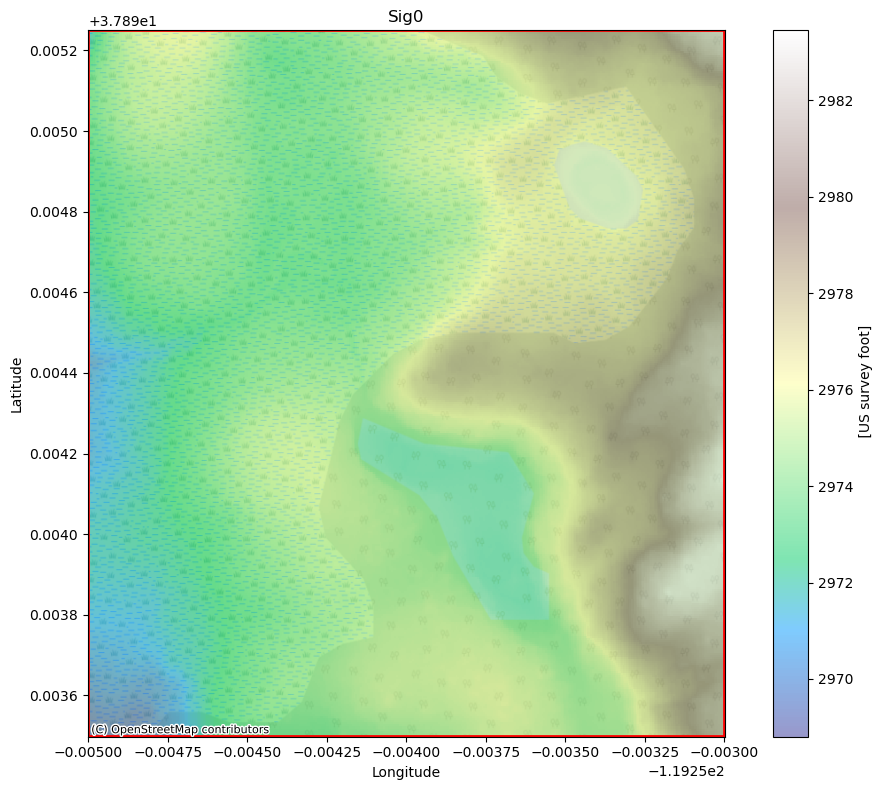

In [35]:
import contextily as ctx
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
    
lat_min_tiny, lat_max_tiny = 37.8935, 37.89525
lon_min_tiny, lon_max_tiny = -119.255, -119.253

fig, ax = plt.subplots(figsize=(10, 8))

dem_meters.plot(alpha=0.5, ax=ax, cmap='terrain')

dana_box = gpd.GeoDataFrame(
    {'geometry': [shapely.geometry.box(lon_min_tiny, lat_min_tiny, lon_max_tiny, lat_max_tiny)]},
    crs='EPSG:4326'
)
dana_box.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)

ctx.add_basemap(
    ax,
    crs='EPSG:4326',           # tell contextily your data is in lon/lat
    source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
    zoom='auto',
)


ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Sig0')
plt.tight_layout()
plt.show()

In [37]:
from scipy.interpolate import RegularGridInterpolator
# Adjust coordinate names to match your tif_data
dem_lats = dem_meters['y'].values   # or 'lat', 'latitude'
dem_lons = dem_meters['x'].values   # or 'lon', 'longitude'
dem_vals = dem_meters.squeeze().values  # drops any size-1 dimensions (e.g. band)       # 2D array (lat, lon)

# DEM lats often go high->low (north->south), 
# RegularGridInterpolator requires monotonically increasing
if dem_lats[0] > dem_lats[-1]:
    dem_lats = dem_lats[::-1]
    dem_vals = dem_vals[::-1, :]

# --- Build interpolator ---
interpolator = RegularGridInterpolator(
    (dem_lats, dem_lons),
    dem_vals,
    method='linear',
    bounds_error=False,
    fill_value=np.nan  # points outside DEM extent get NaN
)

In [ ]:
mean_height_store = []
dem_diff_store = []
day_list = []
granule_list = []
for result in snow_results:
    # print(result['umm']['GranuleUR'])
    granule_list.append(result['umm']['GranuleUR'])
# for download_index in range(len(river_results)):

for download_file in snow_results[4:-2]:
    # if download_index <= 9:
    #     continue
    granule = download_file['umm']['GranuleUR']
    print(granule)
    if "PIC" in granule and granule.replace("PID", "PGD") in granule_list:
        print(f"Skipping {granule} because PGC version exists")
        continue
    output_dir = './data_downloads/pixc_downloads'
    os.makedirs(output_dir, exist_ok=True)
    # current_pixc_file =earthaccess.download(river_results[download_index], output_dir)
    current_pixc_file =earthaccess.download(download_file, output_dir)
    current_pixc = xr.open_dataset(current_pixc_file[0], group = 'pixel_cloud', engine='h5netcdf').load()

    day = pd.to_datetime(current_pixc.illumination_time.values).normalize().unique()[0]
    day_list.append(day)

    # ds_PIXC_winter.sel(latitude=slice(37.88, 37.91), longitude=slice(-119.27, -119.25))
    lat_min, lat_max = 37.88, 37.91
    lon_min, lon_max = -119.27, -119.25

    mask = (
        (current_pixc['latitude'] >= lat_min) &
        (current_pixc['latitude'] <= lat_max) &
        (current_pixc['longitude'] >= lon_min) &
        (current_pixc['longitude'] <= lon_max)
    )
    subset = current_pixc.isel(points=mask.values)  # or whatever your dim is named

    pc_lats = subset['latitude'].values   # adjust name as needed
    pc_lons = subset['longitude'].values

    dem_at_points = interpolator(np.column_stack([pc_lats, pc_lons]))

    # --- Compute difference ---
    # point cloud height minus DEM height
    height_diff = subset['height'].values - dem_at_points  # adjust variable name

    # --- Optionally attach back to xarray ---
    subset['height_diff'] = ('points', height_diff)  # adjust dim name

    lat_min_tiny, lat_max_tiny = 37.8935, 37.89525
    lon_min_tiny, lon_max_tiny = -119.255, -119.253
    mask = (
        (subset['latitude'] >= lat_min_tiny) &
        (subset['latitude'] <= lat_max_tiny) &
        (subset['longitude'] >= lon_min_tiny) &
        (subset['longitude'] <= lon_max_tiny)
    )
    subset_tiny = subset.isel(points=mask.values)  # or whatever your dim is named

    # From subset tiny, filter out all points where height is less than 2940 or greater than 2960
    mask = (subset_tiny['height'] >= 2930) & (subset_tiny['height'] <= 2970)
    subset_tiny = subset_tiny.isel(points=mask.values)  # or whatever your dim is named
    # Create hexbin on a regular axes first to get the extent
    fig, ax = plt.subplots(figsize=(10, 8))
    # test_snow_tile.sel(Day=147, Stats=0).SWE_Post.plot(ax=ax, x='Longitude', y='Latitude', vmin=0, vmax=2, alpha=0.5)

    scatter1 = ax.scatter(x=subset.longitude, y=subset.latitude, c=subset.height, cmap='Reds', vmin=2930, vmax=2970, alpha=1)

    ax.set_xlim(-119.27, -119.25)
    ax.set_ylim(37.88, 37.91)

    dana_box = gpd.GeoDataFrame(
        {'geometry': [shapely.geometry.box(lon_min_tiny, lat_min_tiny, lon_max_tiny, lat_max_tiny)]},
        crs='EPSG:4326'
    )
    dana_box.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
    # Add basemap — contextily expects the axes CRS to be Web Mercator (EPSG:3857)
    # but if your data is in WGS84 lon/lat (EPSG:4326), use crs= parameter:
    ctx.add_basemap(
        ax,
        crs='EPSG:4326',           # tell contextily your data is in lon/lat
        source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
        zoom='auto',
    )

    plt.colorbar(scatter1, ax=ax, label='Mean Sig0')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(day)
    plt.tight_layout()
    plt.show()
    
    mean_height_store.append(subset_tiny.height.mean().values.item())
    print(subset_tiny.height.mean().values.item())
    
    dem_diff_store.append(subset_tiny.height_diff.mean().values.item())
    print(subset_tiny.height_diff.mean().values.item())


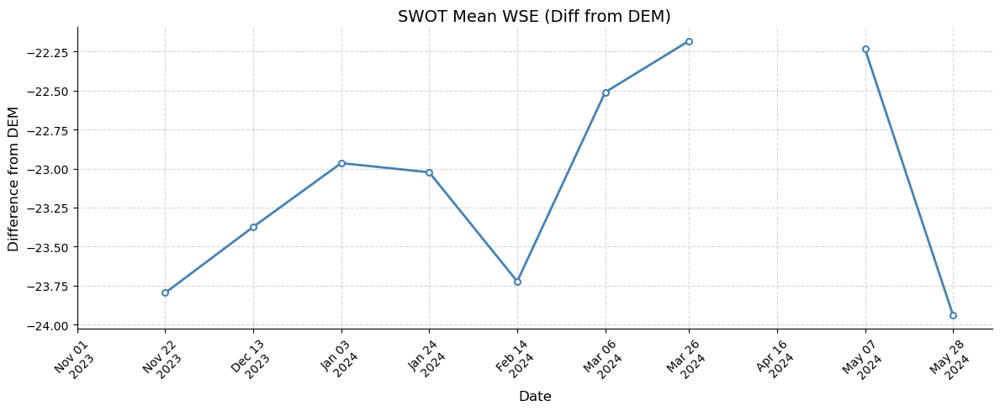

In [39]:
fig, ax = plt.subplots(figsize=(12, 5))

ax.plot(day_list[0:11], dem_diff_store[0:11], 
        color='steelblue', linewidth=2, 
        marker='o', markersize=5, markerfacecolor='white', markeredgewidth=1.5)

# Format x-axis as dates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d\n%Y'))
# ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.set_xticks(day_list[0:11])
# ax.tick_params(axis='x', rotation=45)
fig.autofmt_xdate(rotation=45, ha='center')

# Labels and styling
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Difference from DEM', fontsize=12)
ax.set_title('SWOT Mean WSE (Diff from DEM)', fontsize=14)

ax.grid(True, linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

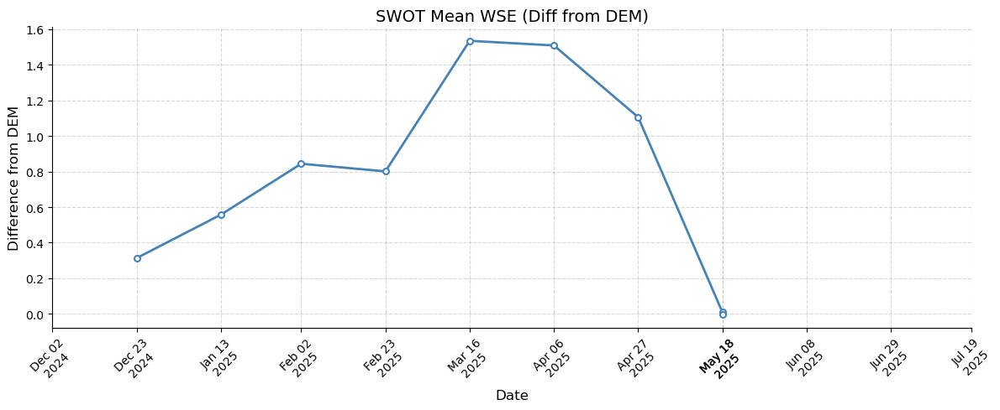

In [64]:
fig, ax = plt.subplots(figsize=(12, 5))

ax.plot(day_list[20:-2], [x + 23.8 for x in dem_diff_store[20:-2]],
        color='steelblue', linewidth=2, 
        marker='o', markersize=5, markerfacecolor='white', markeredgewidth=1.5)

# Format x-axis as dates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d\n%Y'))
# ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.set_xticks(day_list[19:-2])
# ax.tick_params(axis='x', rotation=45)
fig.autofmt_xdate(rotation=45, ha='center')

# Labels and styling
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Difference from DEM', fontsize=12)
ax.set_title('SWOT Mean WSE (Diff from DEM)', fontsize=14)

ax.grid(True, linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

In [110]:
filename = "/Users/masa6503/Downloads/tuolemne_dana_meadows_ca2019_yosemite_dem_J1392084/tuolemne_dana_meadows_ca2019_yosemite_dem_J1392084tR0_C0.tif"
tif_data = rxr.open_rasterio(filename, masked=True)
dem_wgs84 = tif_data.rio.reproject("EPSG:4326")

In [127]:
from scipy.interpolate import RegularGridInterpolator

dem_tol = dem_wgs84.squeeze()
lat_min_tiny, lat_max_tiny = 37.880, 37.887
lon_min_tiny, lon_max_tiny = -119.387, -119.378
dem_tol=dem_tol.sel(y=slice(lat_max_tiny, lat_min_tiny), x=slice(lon_min_tiny, lon_max_tiny))
# convert DEM from feet to meters
dem_tol = dem_tol.astype('float32')
dem_meters_tol = dem_tol * 0.3048


# Adjust coordinate names to match your tif_data
dem_lats_tol = dem_meters_tol['y'].values   # or 'lat', 'latitude'
dem_lons_tol = dem_meters_tol['x'].values   # or 'lon', 'longitude'
dem_vals_tol = dem_meters_tol.squeeze().values  # drops any size-1 dimensions (e.g. band)       # 2D array (lat, lon)

# DEM lats often go high->low (north->south), 
# RegularGridInterpolator requires monotonically increasing
if dem_lats_tol[0] > dem_lats_tol[-1]:
    dem_lats_tol = dem_lats_tol[::-1]
    dem_vals_tol = dem_vals_tol[::-1, :]

# --- Build interpolator ---
interpolator_tol = RegularGridInterpolator(
    (dem_lats_tol, dem_lons_tol),
    dem_vals_tol,
    method='linear',
    bounds_error=False,
    fill_value=np.nan  # points outside DEM extent get NaN
)

In [112]:
dem_wgs84.x.min()

<xarray.DataArray 'x' ()> Size: 8B
array(-119.42582296)
Coordinates:
    spatial_ref  int64 8B 0
Attributes:
    axis:           X
    long_name:      longitude
    standard_name:  longitude
    units:          degrees_east

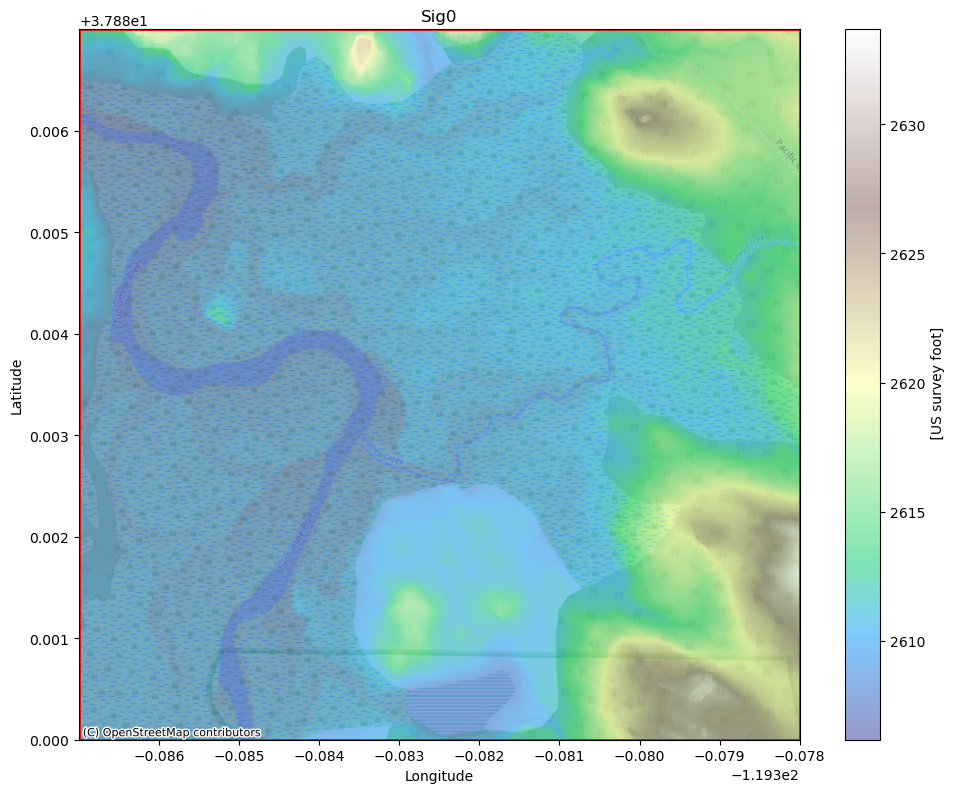

In [128]:
fig, ax = plt.subplots(figsize=(10, 8))

dem_meters_tol.plot(alpha=0.5, ax=ax, cmap='terrain')

tol_box = gpd.GeoDataFrame(
    {'geometry': [shapely.geometry.box(lon_min_tiny, lat_min_tiny, lon_max_tiny, lat_max_tiny)]},
    crs='EPSG:4326'
)
tol_box.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)

ctx.add_basemap(
    ax,
    crs='EPSG:4326',           # tell contextily your data is in lon/lat
    source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
    zoom='auto',
)


ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Sig0')
plt.tight_layout()
plt.show()

In [135]:
dem_meters_tol.max()-23.8

<xarray.DataArray ()> Size: 4B
array(2609.8997, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_SOFTWARE:  Digital Coast Data Access Viewer
    AREA_OR_POINT:     Area
    scale_factor:      1.0
    add_offset:        0.0
    units:             US survey foot

SWOT_L2_HR_PIXC_021_567_221R_20240930T183112_20240930T183123_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2595.617431640625
Min height in subset tiny: 2571.974853515625


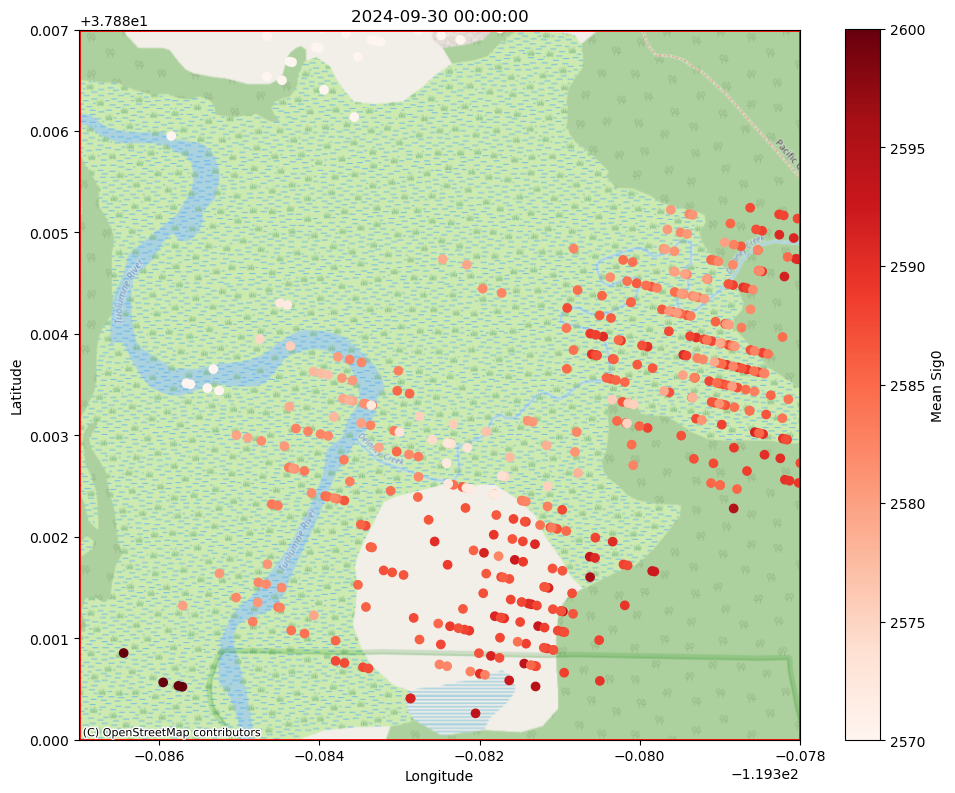

2584.7421875
-25.82273003834253
SWOT_L2_HR_PIXC_022_567_221R_20241021T151616_20241021T151627_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.296630859375
Min height in subset tiny: 2572.949951171875


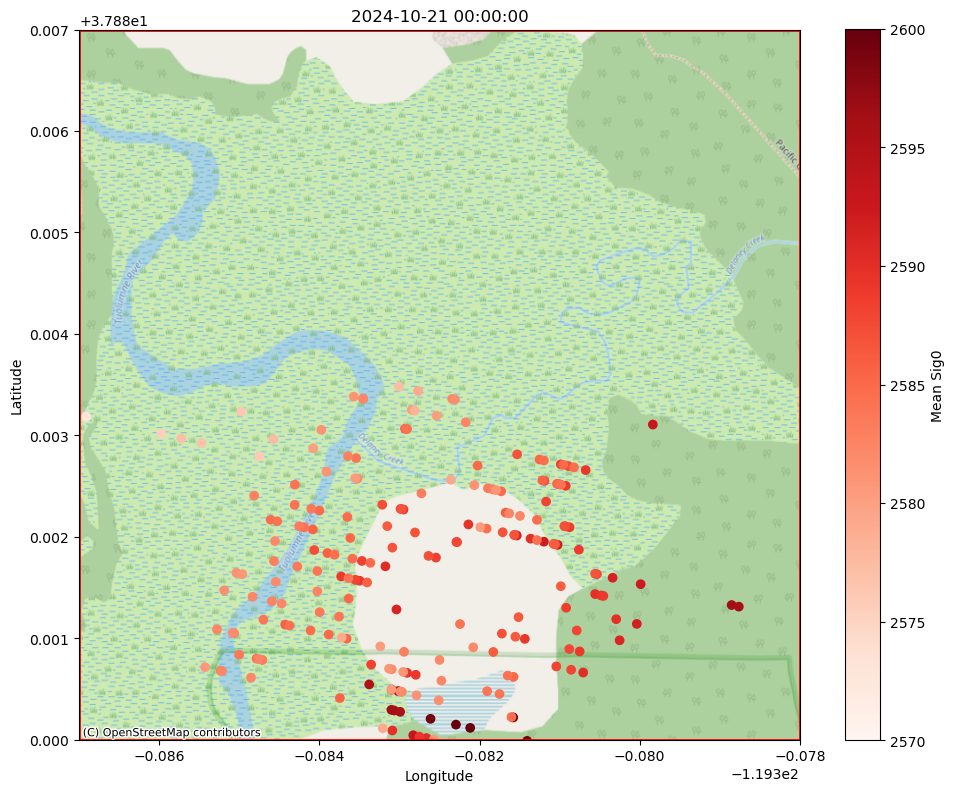

2585.359619140625
-24.16579195643959
SWOT_L2_HR_PIXC_023_567_221R_20241111T120120_20241111T120131_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.519287109375
Min height in subset tiny: 2577.522216796875


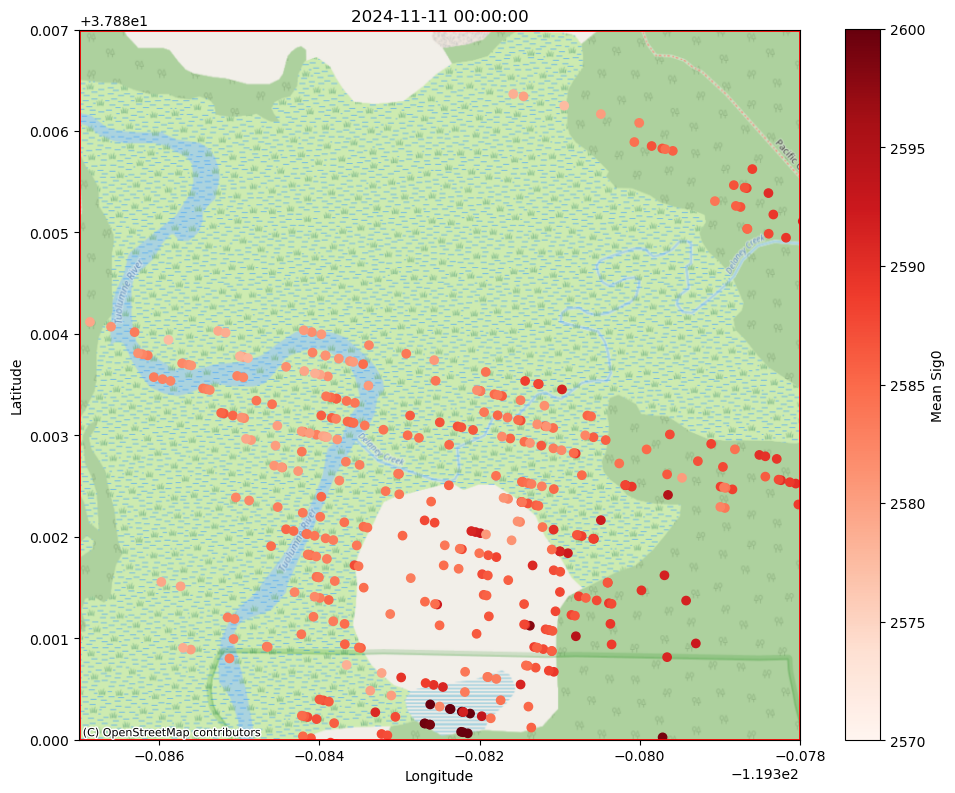

2585.16455078125
-24.959825871317502
SWOT_L2_HR_PIXC_024_567_221R_20241202T084625_20241202T084636_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.9677734375
Min height in subset tiny: 2570.177001953125


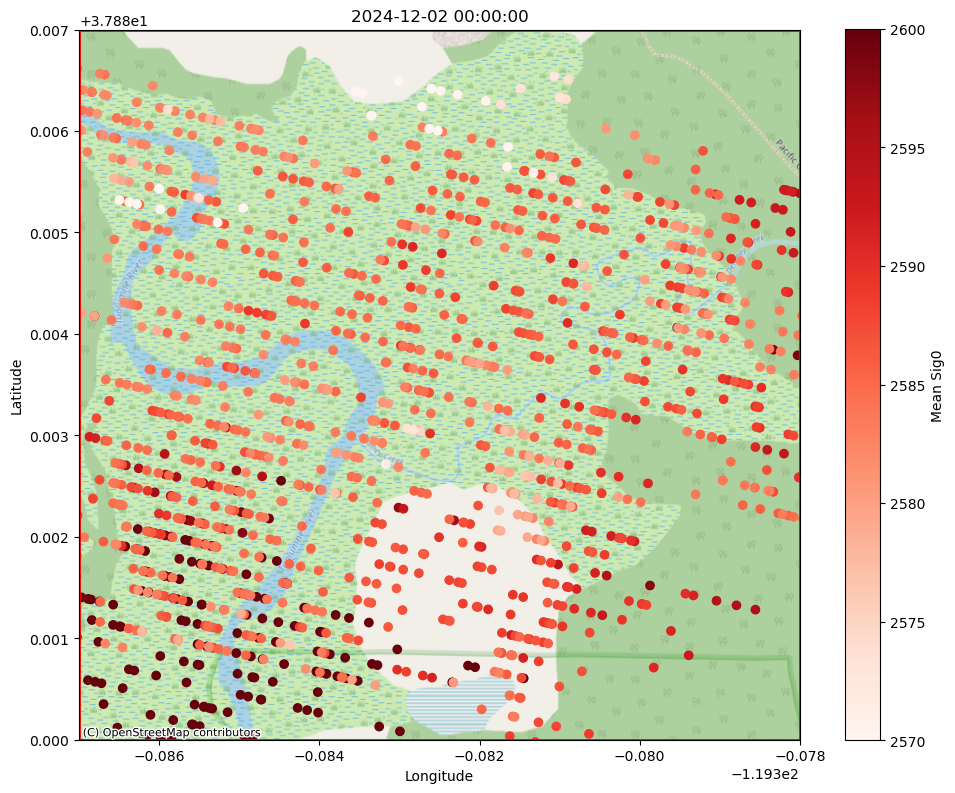

2585.644775390625
-23.846975051900483
SWOT_L2_HR_PIXC_025_567_221R_20241223T053129_20241223T053140_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

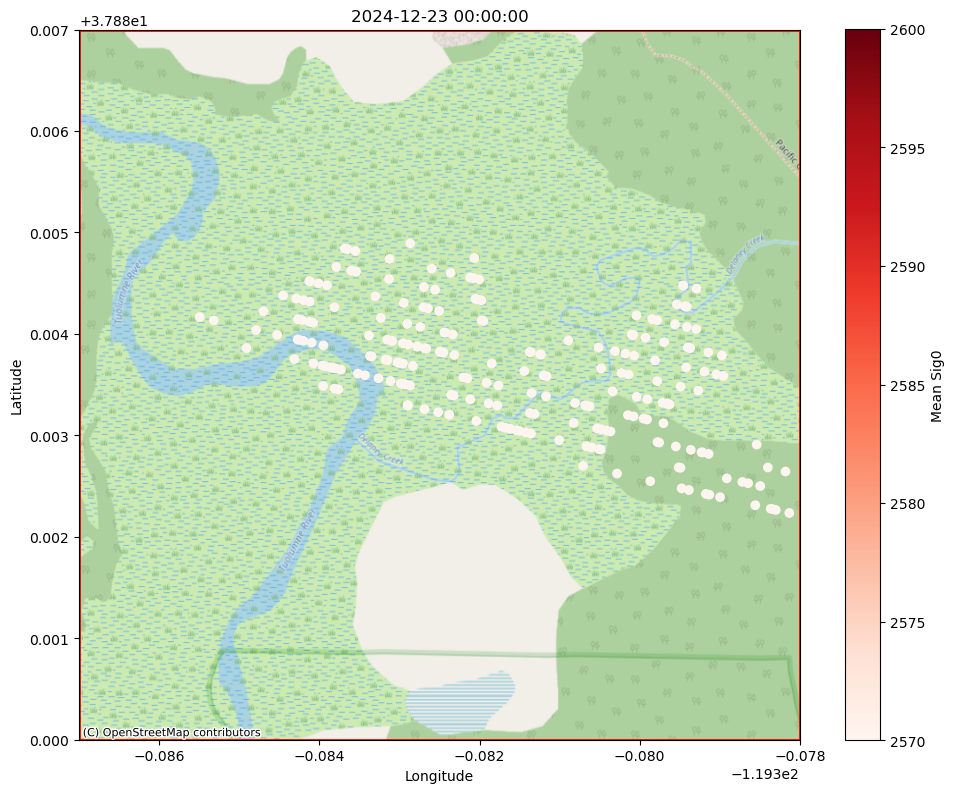

nan
nan
SWOT_L2_HR_PIXC_026_567_221R_20250113T021633_20250113T021644_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.254150390625
Min height in subset tiny: 2570.2216796875


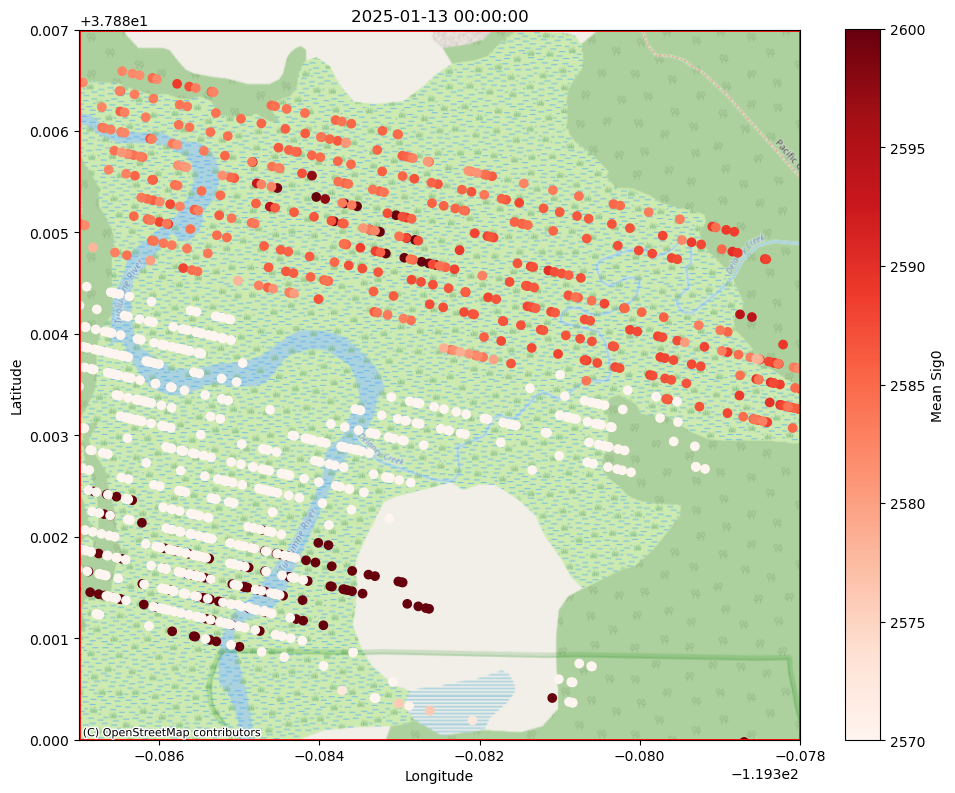

2585.46240234375
-23.884903544144898
SWOT_L2_HR_PIXC_027_567_221R_20250202T230137_20250202T230148_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2598.70947265625
Min height in subset tiny: 2571.7705078125


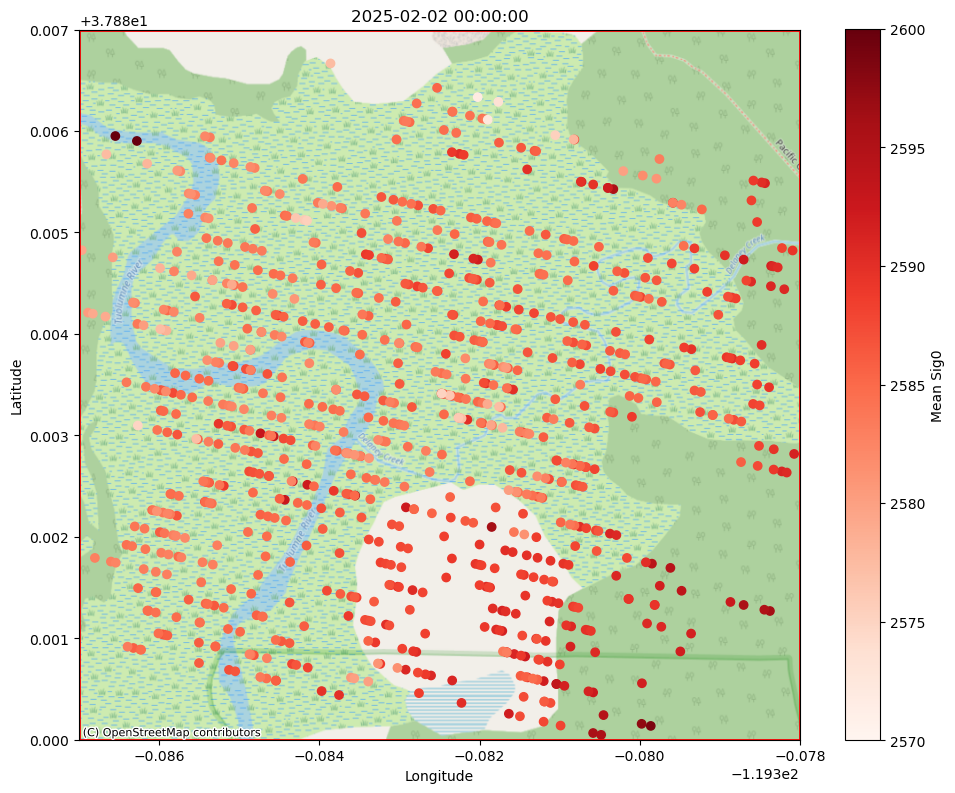

2585.938232421875
-23.562314880531403
SWOT_L2_HR_PIXC_028_567_221R_20250223T194643_20250223T194654_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.416259765625
Min height in subset tiny: 2570.182861328125


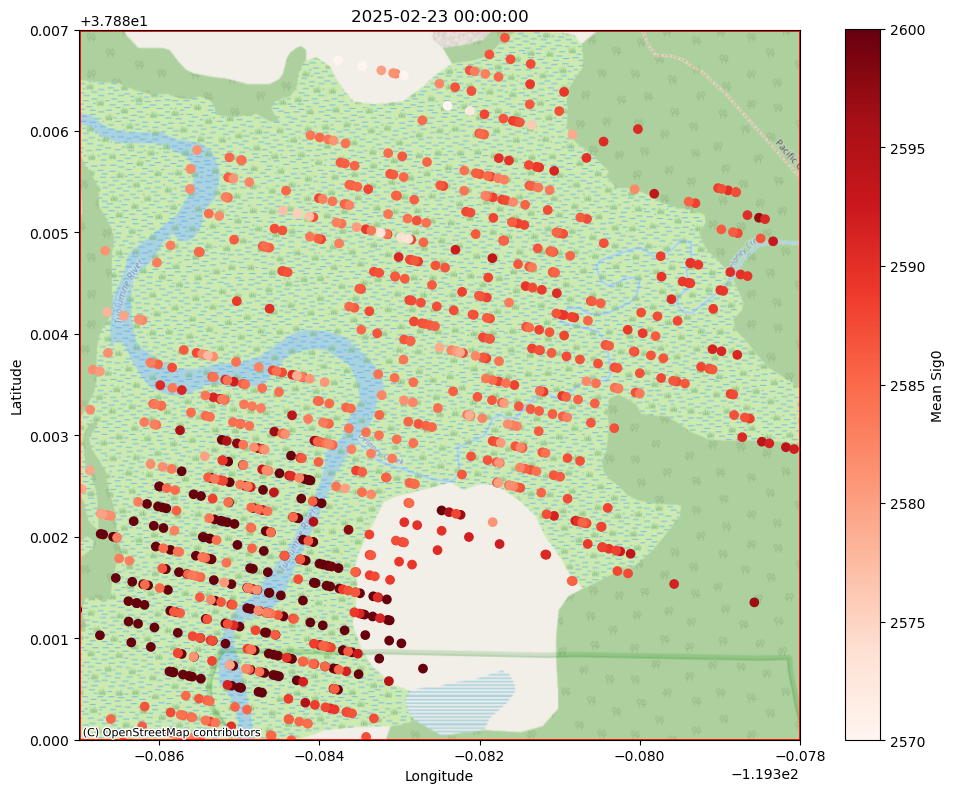

2586.297119140625
-22.728375056838427
SWOT_L2_HR_PIXC_029_567_221R_20250316T163147_20250316T163158_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.870361328125
Min height in subset tiny: 2570.02490234375


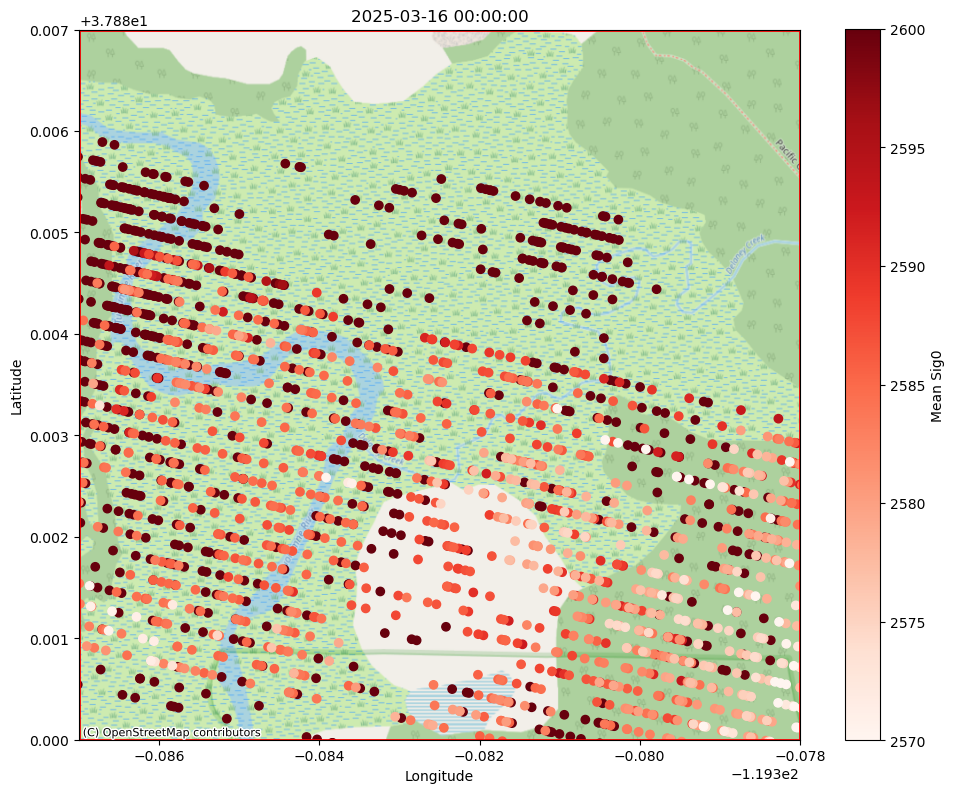

2583.769775390625
-28.60876132428221
SWOT_L2_HR_PIXC_030_567_221R_20250406T131650_20250406T131701_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.90576171875
Min height in subset tiny: 2580.35498046875


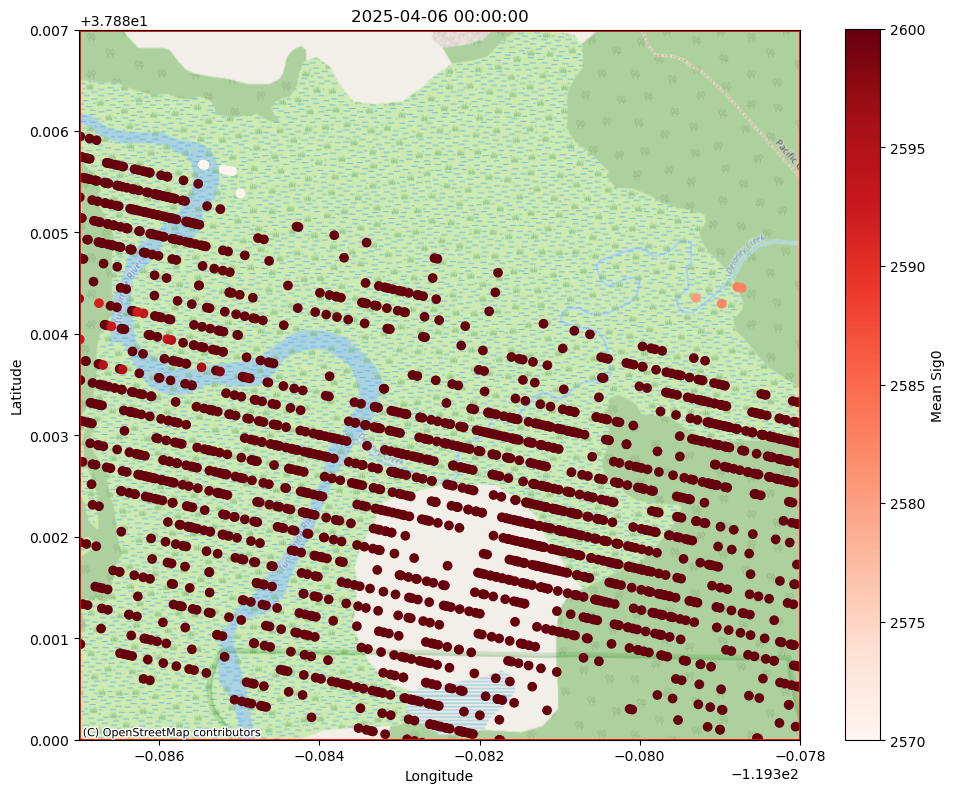

2592.134765625
-16.641975730732746
SWOT_L2_HR_PIXC_031_567_221R_20250427T100156_20250427T100207_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2589.220458984375
Min height in subset tiny: 2580.240234375


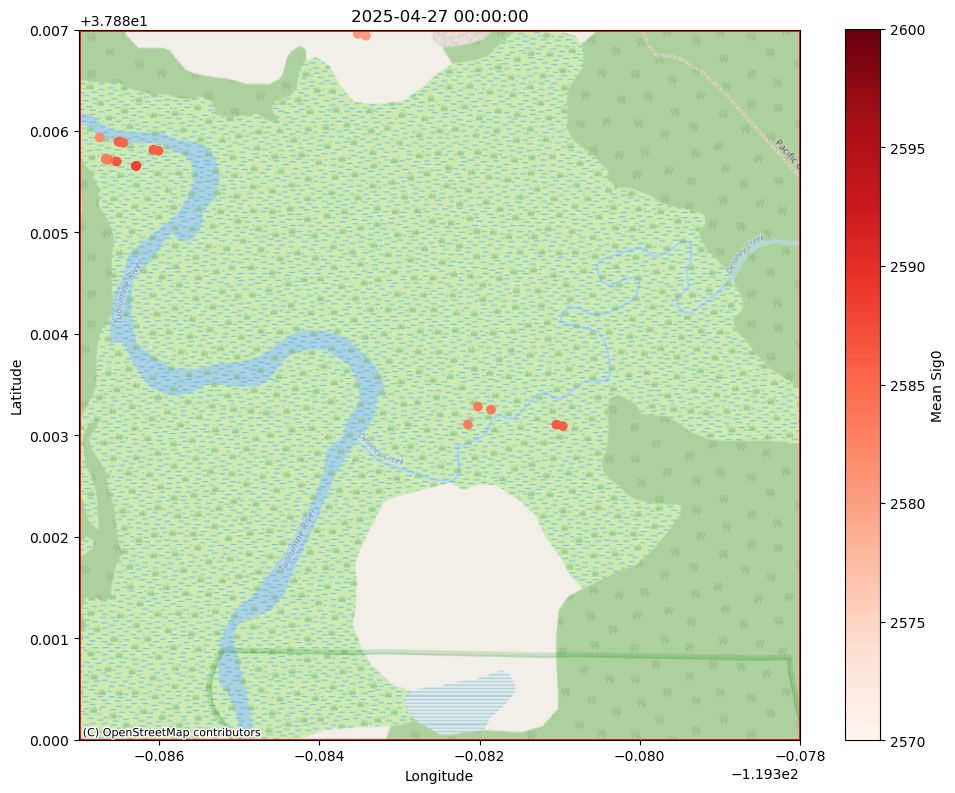

2584.813720703125
-23.652803482490004
SWOT_L2_HR_PIXC_032_567_221R_20250518T064701_20250518T064712_PID0_01
Skipping SWOT_L2_HR_PIXC_032_567_221R_20250518T064701_20250518T064712_PID0_01 because PGC version exists
SWOT_L2_HR_PIXC_032_567_221R_20250518T064701_20250518T064712_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.501708984375
Min height in subset tiny: 2574.275634765625


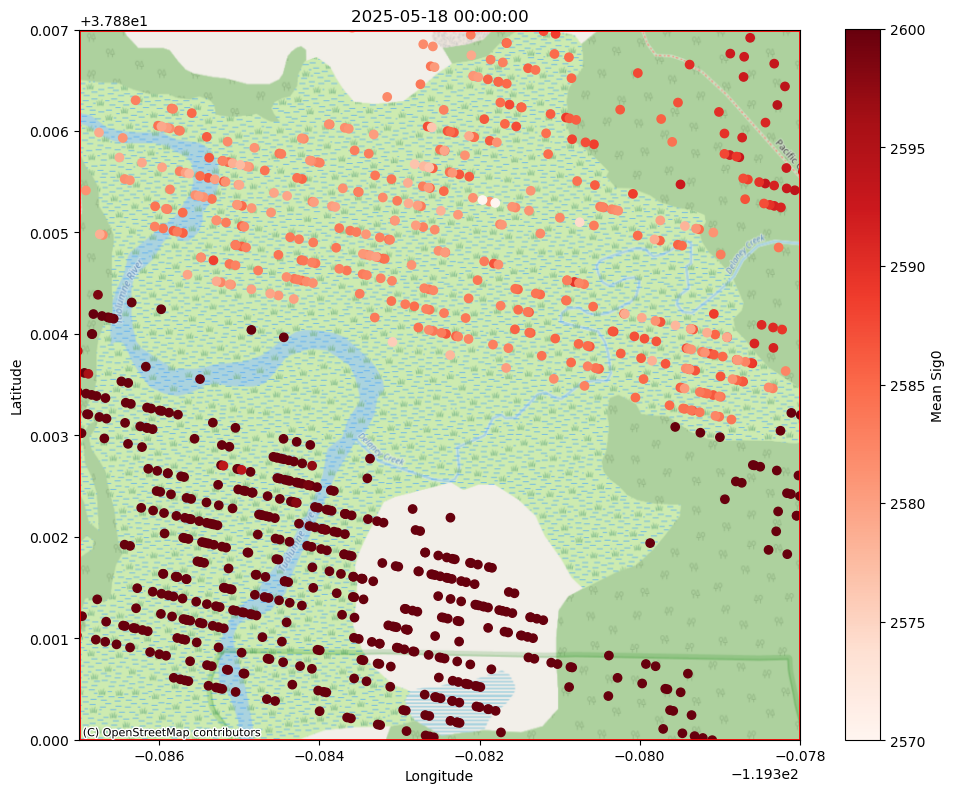

2584.14453125
-25.881658244130833
SWOT_L2_HR_PIXC_033_567_221R_20250608T033206_20250608T033217_PID0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2599.91748046875
Min height in subset tiny: 2575.824951171875


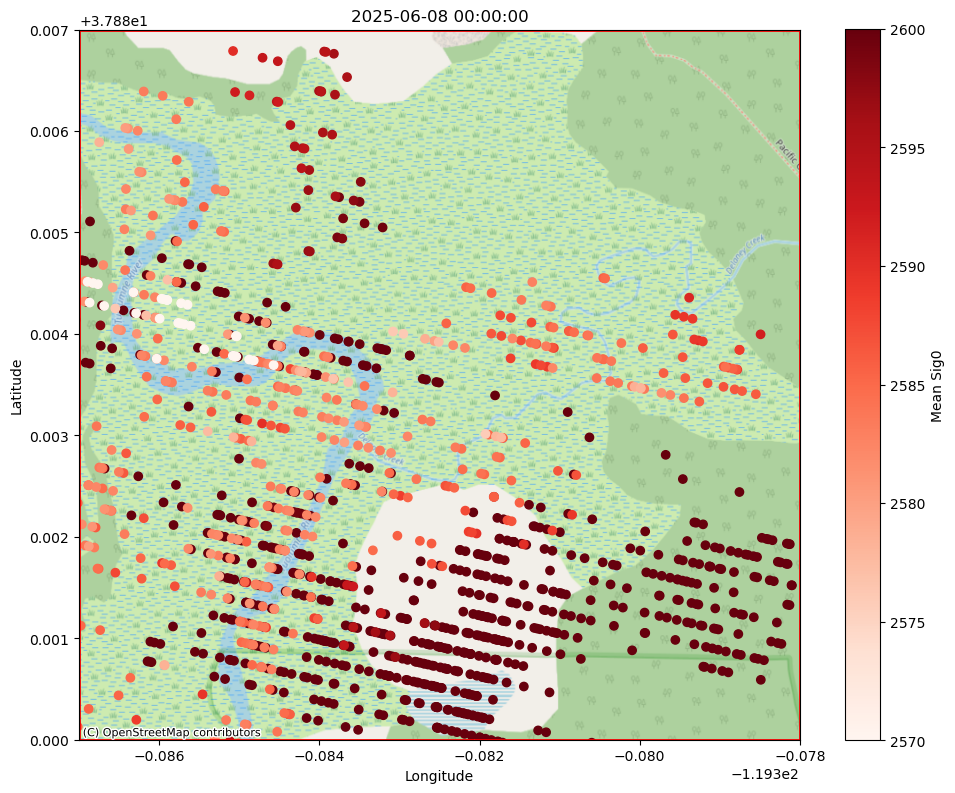

2585.320068359375
-23.186150847078064
SWOT_L2_HR_PIXC_034_567_221R_20250629T001712_20250629T001723_PID0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2588.619384765625
Min height in subset tiny: 2574.302978515625


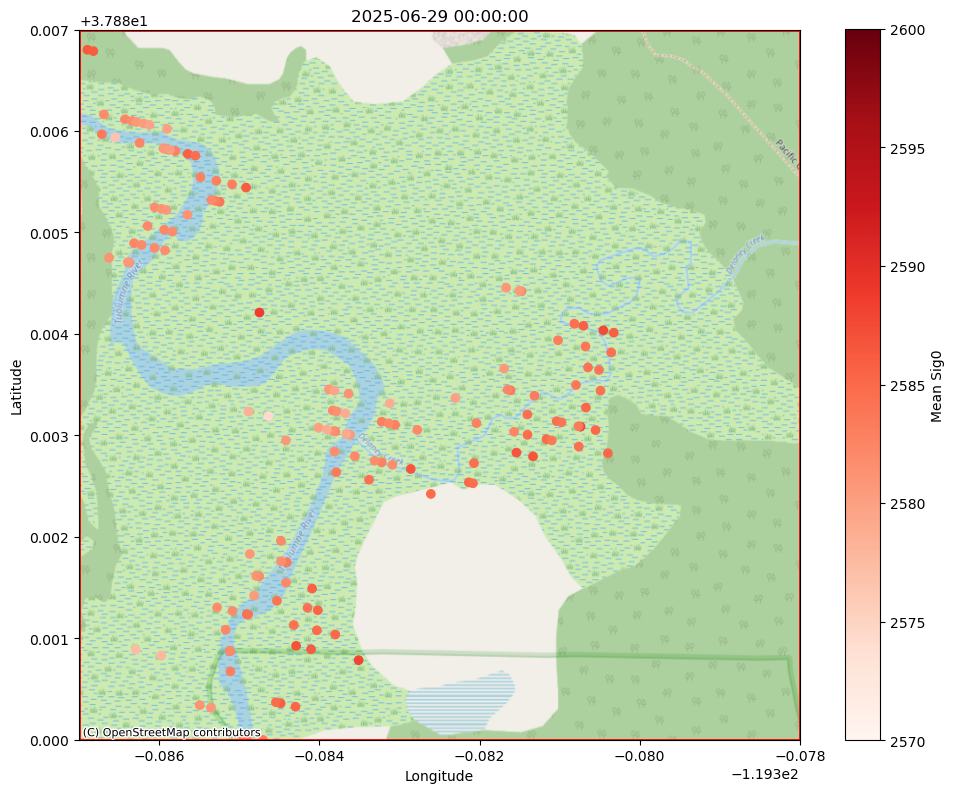

2582.802978515625
-25.206591478068088
SWOT_L2_HR_PIXC_035_567_221R_20250719T210217_20250719T210228_PID0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

Max height in subset tiny: 2589.03955078125
Min height in subset tiny: 2576.0986328125


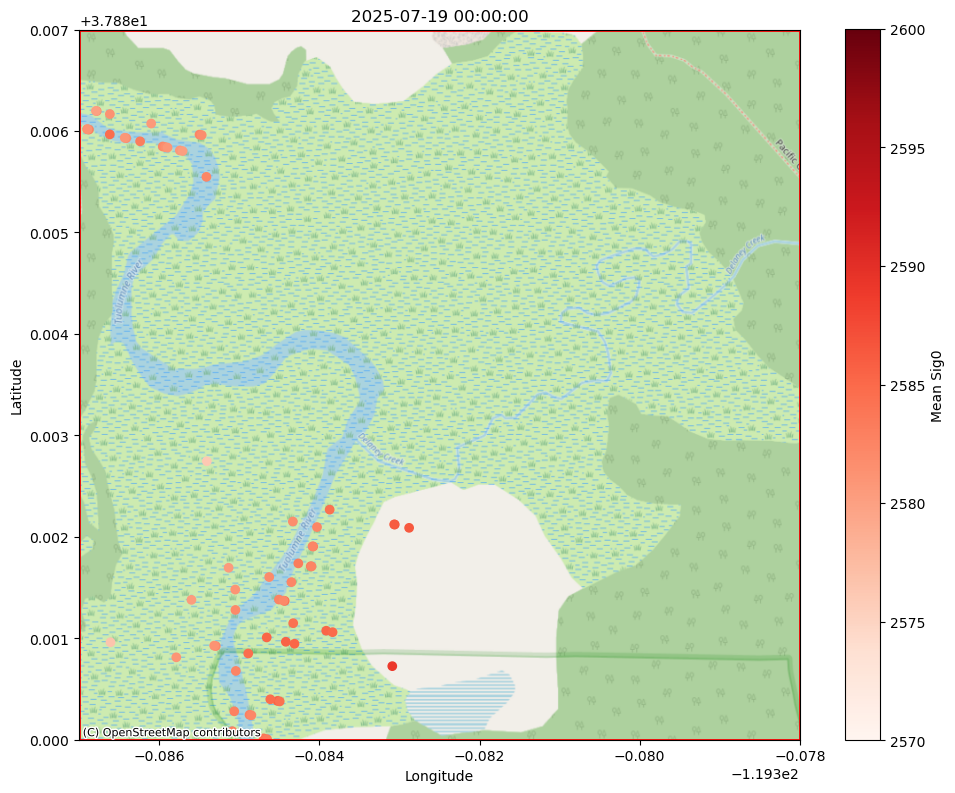

2582.696044921875
-24.900288671108


In [137]:
mean_height_store = []
dem_diff_store = []
day_list = []
granule_list = []
for result in snow_results:
#     result = snow_results[-12]
#     # print(result['umm']['GranuleUR'])
    granule_list.append(result['umm']['GranuleUR'])
# # for download_index in range(len(river_results)):

# for download_file in snow_results[4:-2]:
for download_file in snow_results[20:-4]:
    # if download_index <= 9:
    #     continue
# download_file = snow_results[-13]
    granule = download_file['umm']['GranuleUR']
    print(granule)
    if "PID" in granule and granule.replace("PID", "PGD") in granule_list:
        print(f"Skipping {granule} because PGC version exists")
        continue
    output_dir = './data_downloads/pixc_downloads'
    os.makedirs(output_dir, exist_ok=True)
    # current_pixc_file =earthaccess.download(river_results[download_index], output_dir)
    current_pixc_file =earthaccess.download(download_file, output_dir)
    current_pixc = xr.open_dataset(current_pixc_file[0], group = 'pixel_cloud', engine='h5netcdf').load()


    day = pd.to_datetime(current_pixc.illumination_time.values).normalize().unique()[0]
    day_list.append(day)

    # ds_PIXC_winter.sel(latitude=slice(37.88, 37.91), longitude=slice(-119.27, -119.25))
    # lat_min, lat_max = 37.88, 37.91
    # lon_min, lon_max = -119.27, -119.25

    t_lat_min, t_lat_max = 37.8696, 37.8906
    t_lon_min, t_lon_max = -119.395762, -119.352025
    mask = (
        (current_pixc['latitude'] >= t_lat_min) &
        (current_pixc['latitude'] <= t_lat_max) &
        (current_pixc['longitude'] >= t_lon_min) &
        (current_pixc['longitude'] <= t_lon_max)
    )
    subset = current_pixc.isel(points=mask.values)  # or whatever your dim is named

    pc_lats = subset['latitude'].values   # adjust name as needed
    pc_lons = subset['longitude'].values

    dem_at_points = interpolator_tol(np.column_stack([pc_lats, pc_lons]))

    # # --- Compute difference ---
    # # point cloud height minus DEM height
    height_diff = subset['height'].values - dem_at_points  # adjust variable name

    # # --- Optionally attach back to xarray ---
    subset['height_diff'] = ('points', height_diff)  # adjust dim name

    mask = (
        (subset['latitude'] >= lat_min_tiny) &
        (subset['latitude'] <= lat_max_tiny) &
        (subset['longitude'] >= lon_min_tiny) &
        (subset['longitude'] <= lon_max_tiny)
    )
    subset_tiny = subset.isel(points=mask.values)  # or whatever your dim is named

    # From subset tiny, filter out all points where height is less than 2940 or greater than 2960
    mask = (subset_tiny['height'] >= 2570) & (subset_tiny['height'] <= 2600)
    subset_tiny = subset_tiny.isel(points=mask.values)  # or whatever your dim is named
    if subset_tiny.height.size != 0:
        print(f"Max height in subset tiny: {subset_tiny.height.max().values.item()}")
        print(f"Min height in subset tiny: {subset_tiny.height.min().values.item()}")
    # Create hexbin on a regular axes first to get the extent
    fig, ax = plt.subplots(figsize=(10, 8))
    # test_snow_tile.sel(Day=147, Stats=0).SWE_Post.plot(ax=ax, x='Longitude', y='Latitude', vmin=0, vmax=2, alpha=0.5)

    scatter1 = ax.scatter(x=subset_tiny.longitude, y=subset_tiny.latitude, c=subset_tiny.height, cmap='Reds', vmin=2570, vmax=2600, alpha=1)

    ax.set_xlim(lon_min_tiny, lon_max_tiny)
    ax.set_ylim(lat_min_tiny, lat_max_tiny)

    tol_box = gpd.GeoDataFrame(
        {'geometry': [shapely.geometry.box(lon_min_tiny, lat_min_tiny, lon_max_tiny, lat_max_tiny)]},
        crs='EPSG:4326'
    )
    tol_box.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
    # Add basemap — contextily expects the axes CRS to be Web Mercator (EPSG:3857)
    # but if your data is in WGS84 lon/lat (EPSG:4326), use crs= parameter:
    ctx.add_basemap(
        ax,
        crs='EPSG:4326',           # tell contextily your data is in lon/lat
        source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
        zoom='auto',
    )

    plt.colorbar(scatter1, ax=ax, label='Mean Sig0')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(day)
    plt.tight_layout()
    plt.show()

    mean_height_store.append(subset_tiny.height.mean().values.item())
    print(subset_tiny.height.mean().values.item())
    
    dem_diff_store.append(subset_tiny.height_diff.mean().values.item())
    print(subset_tiny.height_diff.mean().values.item())

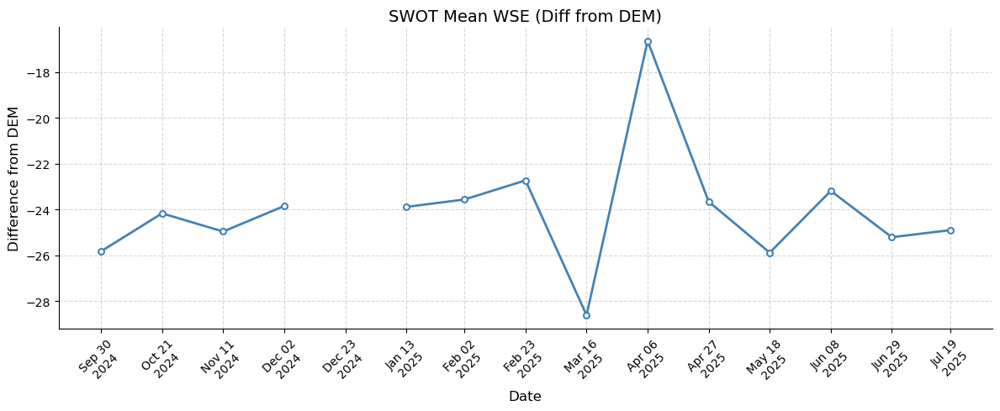

In [138]:
fig, ax = plt.subplots(figsize=(12, 5))

ax.plot(day_list, dem_diff_store, 
        color='steelblue', linewidth=2, 
        marker='o', markersize=5, markerfacecolor='white', markeredgewidth=1.5)

# Format x-axis as dates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d\n%Y'))
# ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.set_xticks(day_list)
# ax.tick_params(axis='x', rotation=45)
fig.autofmt_xdate(rotation=45, ha='center')

# Labels and styling
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Difference from DEM', fontsize=12)
ax.set_title('SWOT Mean WSE (Diff from DEM)', fontsize=14)

ax.grid(True, linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


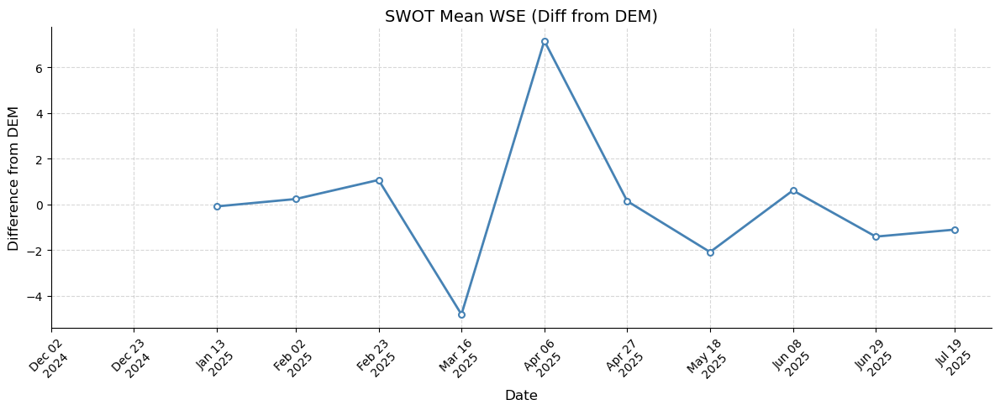

In [131]:
fig, ax = plt.subplots(figsize=(12, 5))

ax.plot(day_list[20:-2], [x + 23.8 for x in dem_diff_store[20:-2]],
        color='steelblue', linewidth=2, 
        marker='o', markersize=5, markerfacecolor='white', markeredgewidth=1.5)

# Format x-axis as dates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d\n%Y'))
# ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.set_xticks(day_list[19:-2])
# ax.tick_params(axis='x', rotation=45)
fig.autofmt_xdate(rotation=45, ha='center')

# Labels and styling
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Difference from DEM', fontsize=12)
ax.set_title('SWOT Mean WSE (Diff from DEM)', fontsize=14)

ax.grid(True, linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

In [67]:
snow_results[-12]

Collection: {'Version': 'D', 'ShortName': 'SWOT_L2_HR_PIXC_D'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'BoundingRectangles': [{'WestBoundingCoordinate': -119.55769931894258, 'SouthBoundingCoordinate': 37.41336920855554, 'EastBoundingCoordinate': -118.92224811023081, 'NorthBoundingCoordinate': 38.16668641342974}]}, 'Track': {'Cycle': 29, 'Passes': [{'Pass': 567, 'Tiles': ['221R']}]}}}
Temporal coverage: {'RangeDateTime': {'EndingDateTime': '2025-03-16T16:31:58.522Z', 'BeginningDateTime': '2025-03-16T16:31:47.433Z'}}
Size(MB): 549.7584896087646
Data: ['https://archive.swot.podaac.earthdata.nasa.gov/podaac-swot-ops-cumulus-protected/SWOT_L2_HR_PIXC_D/SWOT_L2_HR_PIXC_029_567_221R_20250316T163147_20250316T163158_PGD0_01.nc']

(37.7696, 37.9906)

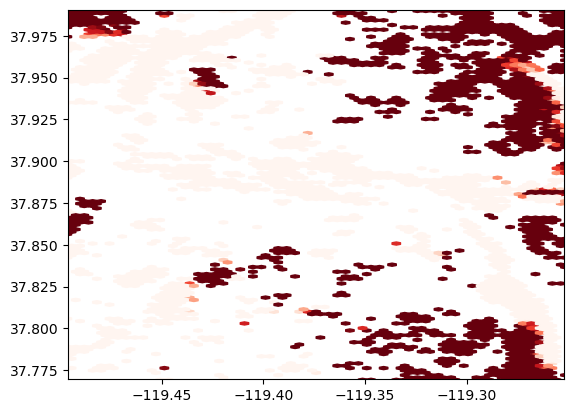

In [83]:
# hexbin plot current_pixc
hb = plt.hexbin(current_pixc.longitude, current_pixc.latitude, C=current_pixc.height, gridsize=500, cmap='Reds', vmin=2930, vmax=2970)

plt.xlim(t_lon_min-0.1, t_lon_max+0.1)
plt.ylim(t_lat_min-0.1, t_lat_max+0.1)

SWOT_L2_HR_PIXC_028_567_221R_20250223T194643_20250223T194654_PGD0_01


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

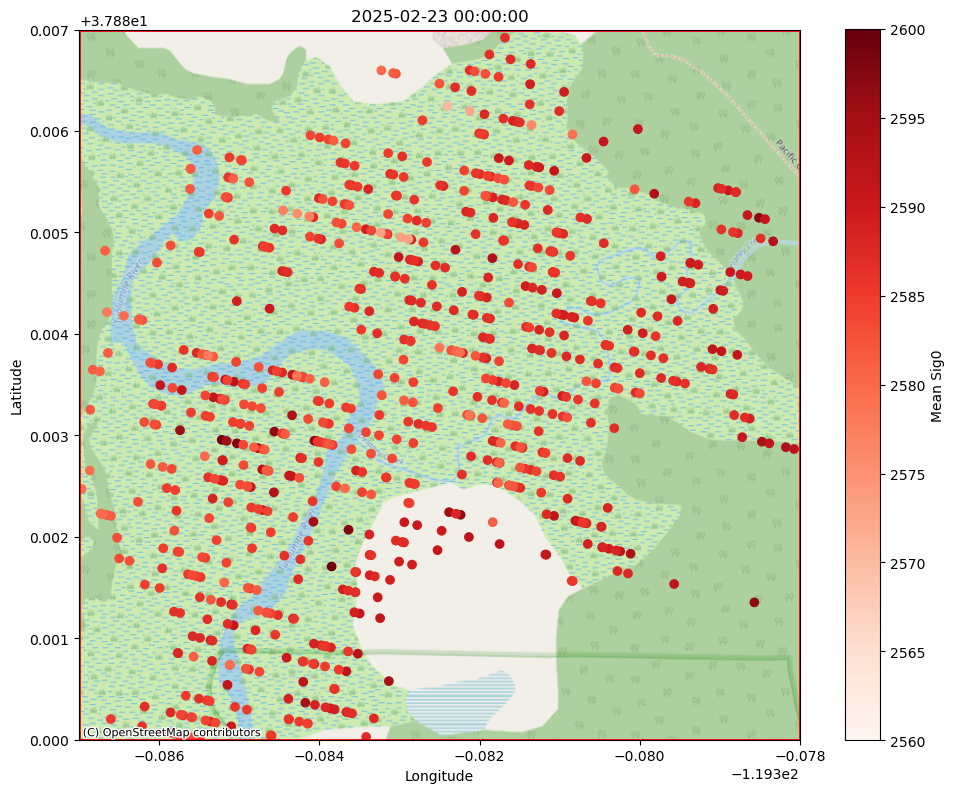

In [125]:
# mean_height_store = []
# dem_diff_store = []
# day_list = []
# granule_list = []
# for result in snow_results:
#     result = snow_results[-12]
#     # print(result['umm']['GranuleUR'])
#     granule_list.append(result['umm']['GranuleUR'])
# # for download_index in range(len(river_results)):

# for download_file in snow_results[4:-2]:
    # if download_index <= 9:
    #     continue
download_file = snow_results[-13]
granule = download_file['umm']['GranuleUR']
print(granule)
# if "PIC" in granule and granule.replace("PID", "PGD") in granule_list:
#     print(f"Skipping {granule} because PGC version exists")
#     continue
output_dir = './data_downloads/pixc_downloads'
os.makedirs(output_dir, exist_ok=True)
# current_pixc_file =earthaccess.download(river_results[download_index], output_dir)
current_pixc_file =earthaccess.download(download_file, output_dir)
current_pixc = xr.open_dataset(current_pixc_file[0], group = 'pixel_cloud', engine='h5netcdf').load()


day = pd.to_datetime(current_pixc.illumination_time.values).normalize().unique()[0]
day_list.append(day)

# ds_PIXC_winter.sel(latitude=slice(37.88, 37.91), longitude=slice(-119.27, -119.25))
lat_min, lat_max = 37.88, 37.91
lon_min, lon_max = -119.27, -119.25

t_lat_min, t_lat_max = 37.8696, 37.8906
t_lon_min, t_lon_max = -119.395762, -119.352025
mask = (
    (current_pixc['latitude'] >= t_lat_min) &
    (current_pixc['latitude'] <= t_lat_max) &
    (current_pixc['longitude'] >= t_lon_min) &
    (current_pixc['longitude'] <= t_lon_max)
)
subset = current_pixc.isel(points=mask.values)  # or whatever your dim is named

test_mask = (subset['height'] >= 2570) & (subset['height'] <= 2600)
subset = subset.isel(points=test_mask.values)  # or whatever your dim is named

pc_lats = subset['latitude'].values   # adjust name as needed
pc_lons = subset['longitude'].values

dem_at_points = interpolator(np.column_stack([pc_lats, pc_lons]))

# # --- Compute difference ---
# # point cloud height minus DEM height
# height_diff = subset['height'].values - dem_at_points  # adjust variable name

# # --- Optionally attach back to xarray ---
# subset['height_diff'] = ('points', height_diff)  # adjust dim name

lat_min_tiny, lat_max_tiny = 37.880, 37.887
lon_min_tiny, lon_max_tiny = -119.387, -119.378
mask = (
    (subset['latitude'] >= lat_min_tiny) &
    (subset['latitude'] <= lat_max_tiny) &
    (subset['longitude'] >= lon_min_tiny) &
    (subset['longitude'] <= lon_max_tiny)
)
subset_tiny = subset.isel(points=mask.values)  # or whatever your dim is named

# From subset tiny, filter out all points where height is less than 2940 or greater than 2960
# mask = (subset_tiny['height'] >= 2930) & (subset_tiny['height'] <= 2970)
# subset_tiny = subset_tiny.isel(points=mask.values)  # or whatever your dim is named
# Create hexbin on a regular axes first to get the extent
fig, ax = plt.subplots(figsize=(10, 8))
# test_snow_tile.sel(Day=147, Stats=0).SWE_Post.plot(ax=ax, x='Longitude', y='Latitude', vmin=0, vmax=2, alpha=0.5)

# scatter1 = ax.scatter(x=subset.longitude, y=subset.latitude, c=subset.height, cmap='Reds', vmin=2560, vmax=2600, alpha=1)
scatter1 = ax.scatter(x=subset_tiny.longitude, y=subset_tiny.latitude, c=subset_tiny.height, cmap='Reds', vmin=2560, vmax=2600, alpha=1)

# ax.set_xlim(-119.27, -119.25)
# ax.set_ylim(37.88, 37.91)

ax.set_xlim(lon_min_tiny, lon_max_tiny)
ax.set_ylim(lat_min_tiny, lat_max_tiny)

dana_box = gpd.GeoDataFrame(
    {'geometry': [shapely.geometry.box(lon_min_tiny, lat_min_tiny, lon_max_tiny, lat_max_tiny)]},
    crs='EPSG:4326'
)
dana_box.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
# Add basemap — contextily expects the axes CRS to be Web Mercator (EPSG:3857)
# but if your data is in WGS84 lon/lat (EPSG:4326), use crs= parameter:
ctx.add_basemap(
    ax,
    crs='EPSG:4326',           # tell contextily your data is in lon/lat
    source=ctx.providers.OpenStreetMap.Mapnik,  # free, no API key needed
    zoom='auto',
)

plt.colorbar(scatter1, ax=ax, label='Mean Sig0')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title(day)
plt.tight_layout()
plt.show()

In [91]:
tif_data

<xarray.DataArray (band: 1, y: 9989, x: 9676)> Size: 387MB
array([[[10549.956, 10548.664, ...,       nan,       nan],
        [10550.571, 10549.574, ...,       nan,       nan],
        ...,
        [ 9570.311,  9570.279, ..., 12328.524, 12328.102],
        [ 9570.439,  9570.353, ..., 12329.211, 12328.715]]],
      shape=(1, 9989, 9676), dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
  * y            (y) float64 80kB 2.161e+06 2.161e+06 ... 2.144e+06 2.144e+06
  * x            (x) float64 77kB 6.918e+06 6.919e+06 ... 6.934e+06 6.934e+06
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_SOFTWARE:  Digital Coast Data Access Viewer
    AREA_OR_POINT:     Area
    scale_factor:      1.0
    add_offset:        0.0
    units:             US survey foot

In [93]:
dem_wgs84.x.min()

<xarray.DataArray 'x' ()> Size: 8B
array(-119.26363722)
Coordinates:
    spatial_ref  int64 8B 0
Attributes:
    axis:           X
    long_name:      longitude
    standard_name:  longitude
    units:          degrees_east